# Imports and Utils

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

In [ ]:
import pandas as pd
import re
from tqdm import tqdm
tqdm.pandas()

import warnings
warnings.filterwarnings(action='ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
basepath = "/content/drive/MyDrive/DataMining22Gruppo8/data/dataset"

In [ ]:
!sudo apt-get install texlive-latex-extra texlive-fonts-recommended dvipng cm-super

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  cm-super-minimal fonts-droid-fallback fonts-lato fonts-lmodern
  fonts-noto-mono fonts-texgyre ghostscript gsfonts javascript-common
  libcupsfilters1 libcupsimage2 libgs9 libgs9-common libijs-0.35 libjbig2dec0
  libjs-jquery libkpathsea6 libpotrace0 libptexenc1 libruby2.5 libsynctex1
  libtexlua52 libtexluajit2 libzzip-0-13 lmodern pfb2t1c2pfb poppler-data
  preview-latex-style rake ruby ruby-did-you-mean ruby-minitest
  ruby-net-telnet ruby-power-assert ruby-test-unit ruby2.5
  rubygems-integration t1utils tex-common tex-gyre texlive-base
  texlive-binaries texlive-latex-base texlive-latex-recommended
  texlive-pictures texlive-plain-generic tipa
Suggested packages:
  fonts-noto ghostscript-x apach

In [ ]:
!pip install tslearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 875 kB 5.0 MB/s 


#Visualization functions

In [ ]:
def visualize(data=None, x=None, y=None, xlabel=None, ylabel=None, title=None, plot_type="plot", ax=None, **kwargs):
  plts = ['plot', 'hist', 'scatter', 'boxplot', 'barplot']
  if plot_type not in plts:
      raise ValueError("Invalid plot type. Expected one of: %s" % plts)
  
  if(plot_type == "scatter"):
    sns.scatterplot(data=data, x=x, y=y, ax=ax, **kwargs)
  elif(plot_type == "plot"):
    sns.lineplot(data=data, x=x, y=y, ax=ax, **kwargs)
  elif(plot_type == "hist"):
    sns.histplot(data=data, x=x, y=y, ax=ax, **kwargs)
  elif(plot_type == "boxplot"):
    sns.boxplot(data=data, x=x, y=y, ax=ax, **kwargs)
  elif(plot_type == "barplot"):
    sns.barplot(data=data, x=x, y=y, ax=ax, **kwargs)

  plt.xlabel(xlabel, fontsize=14)
  plt.ylabel(ylabel, fontsize=14)
  plt.title(title, fontsize=16)
  plt.tick_params(axis='both', which='major', labelsize=14)

In [ ]:
class Correlation():
  def __init__(self,df):
    self.df = df

  def compute(self,frac):
    self.mx = self.df.sample(frac=frac).corr()
  
  def heatmap(self, dim):
    fig, ax = plt.subplots(figsize=(dim, dim))
    im = ax.imshow(self.mx)
    im.set_clim(-1,1)
    fig.colorbar(im, orientation='vertical', fraction = 0.05)

    # Show and rotate ticks
    plt.xticks(np.arange(len(self.mx.columns)),self.mx.columns, rotation=90, fontsize=15)
    plt.yticks(np.arange(len(self.mx.index)),self.mx.index, rotation=0, fontsize=15)

    # Add numerical values
    for i in range(len(self.mx.columns)):
        for j in range(len(self.mx.index)):
            text = ax.text(j, i, round(self.mx.to_numpy()[i, j], 1),
                          ha="center", va="center", color="black")

    plt.show()


In [ ]:
from itertools import combinations

def cluster_plots(df): 
  plots = list(combinations([key for key in df.keys()], 2))
  
  for x,y in plots:
    plt.figure(figsize=(9,6))
    visualize(x=df[x][dbscan.labels_ != -1], y=df[y][dbscan.labels_ != -1], 
            plot_type='scatter', c=dbscan.labels_[dbscan.labels_ != -1], xlabel=x, ylabel=y,
            title="{} over {}".format(x, y)) 
    plt.show

# 3 Classification

We start with the selection of the features we want to use for classification. We will use the features we identified in the clustering phase.

## 3.1 Classification without distance metrics

If we use classification methods which don't rely on distance metrics, we can transform the categorical variables into discrete variables so that the classifier could use them in classification tasks

In [ ]:
def discretize_data(dataset, variables):
    for variable in variables:
        #get the unique variable's values
        var = sorted(dataset[variable].unique())
        
        #generate a mapping from the variable's values to the number representation  
        mapping = dict(zip(var, range(0, len(var) + 1)))

        #add a new colum with the number representation of the variable
        dataset[variable+'_num'] = dataset[variable].map(mapping).astype(int)
    return dataset

In [ ]:
clust_df = pd.read_csv(basepath + '/pp_users_full.csv')

In [ ]:
users_full = pd.read_csv(basepath + '/users_full_1.9.9.csv', lineterminator='\n', index_col=0, parse_dates=['sign_up_date'])

In [ ]:
users_full.keys()

Index(['lang', 'bot', 'sign_up_date', 'statuses_count', 'st_per_day',
       'tot_tweets', 'tot_favorites', 'tot_retweets', 'fav_std', 'rtw_std',
       'fav_max', 'rtw_max', 'fav_mean', 'rtw_mean', 'retw_over_fav',
       'tw_over_retw', 'tw_over_fav', 'tw_afternoon', 'tw_evening',
       'tw_morning', 'tw_night', 'tw_2012', 'tw_2013', 'tw_2014', 'tw_2015',
       'tw_2016', 'tw_2017', 'tw_2018', 'tw_2019', 'tw_2020', 'avg_schar',
       'last_activity', 'activity_period', 'tw_monthly_avg',
       'avg_tweets_ratio', 'month1_tweets', 'frequency_min', 'frequency_mean',
       'frequency_max', 'frequency_entropy', 'entropy_retweet_count',
       'entropy_favorite_count', 'entropy_num_hashtags', 'entropy_num_urls',
       'entropy_num_mentions', 'tot_entropy'],
      dtype='object')

Now we take categorical variables from user dataset and put them in the dataset of selected features

In [ ]:
df = pd.merge(users_full[["lang", "bot"]], clust_df, left_index=True, right_on='user_id')

In [ ]:
variables = ["lang"]
df = discretize_data(df, variables)

Now we can drop the old categorical variables

In [ ]:
df.drop(columns=variables, inplace=True)

In [ ]:
df.keys()

Index(['bot', 'user_id', 'statuses_count', 'st_per_day', 'tot_tweets',
       'tot_favorites', 'tot_retweets', 'rtw_max', 'fav_mean', 'rtw_mean',
       'retw_over_fav', 'tw_over_retw', 'tw_over_fav', 'avg_schar',
       'activity_period', 'tw_monthly_avg', 'avg_tweets_ratio',
       'frequency_min', 'frequency_mean', 'frequency_max', 'frequency_entropy',
       'tot_entropy', 'lang_num'],
      dtype='object')

In [ ]:
df.drop(columns="user_id", inplace=True)

Let's now split the dataset into training set and test set:

In [ ]:
from sklearn.model_selection import train_test_split
label = df.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(df, label, stratify=label, test_size=0.30)

### 3.1.1 Decision tree

Create the decision tree:

In [ ]:
from sklearn import tree
dt = tree.DecisionTreeClassifier(criterion='gini', splitter='best', 
                                  max_depth=10, 
                                  min_samples_split=3, min_samples_leaf=4)
dt = dt.fit(train_set, train_label)

Visualize the decision tree:

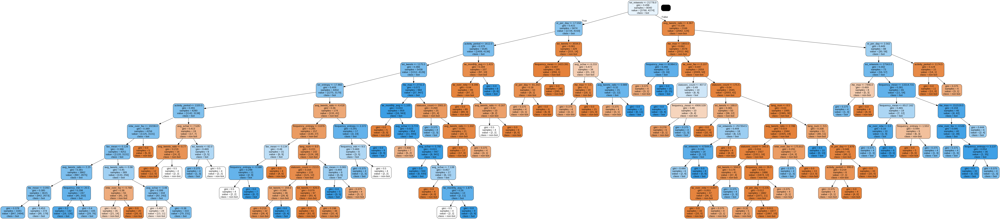

In [ ]:
import pydotplus 
from IPython.display import Image  
dot_data = tree.export_graphviz(dt, out_file=None, 
                         feature_names=list(train_set.columns),  
                         class_names=['non-bot', 'bot'],  
                         filled=True, rounded=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

Once created, we can assess its prediction capability:

In [ ]:
train_pred_dt = dt.predict(train_set)
test_pred_dt = dt.predict(test_set)

In [ ]:
from sklearn import metrics
print('Accuracy train set: ', metrics.accuracy_score(train_label, train_pred_dt))
print('Accuracy test set: ', metrics.accuracy_score(test_label, test_pred_dt))
#precision_score = tp / (tp + fp)
print('Precision train set: ', metrics.precision_score(train_label, train_pred_dt, average='weighted'))
#recall_score = tp / (tp + fn)
print('Recall train set: ', metrics.recall_score(train_label, train_pred_dt, average='weighted'))
#F1 = 2 * (precision * recall) / (precision + recall)
print('F1 score train set: ', metrics.f1_score(train_label, train_pred_dt, average='weighted'))
#metrics.precision_recall_fscore_support compute precisions, recalls, f-measures and support for each class
print('Support train set: ', metrics.precision_recall_fscore_support(train_label, train_pred_dt))

Accuracy train set:  0.8569651741293532
Accuracy test set:  0.845082680591819
Precision train set:  0.8795524090811857
Recall train set:  0.8569651741293532
F1 score train set:  0.8534352903705412
Support train set:  (array([0.97494553, 0.79549754]), array([0.71295805, 0.98385587]), array([0.82361963, 0.87970711]), array([3766, 4274]))


We can see that all the scores are very good. 

In [ ]:
from sklearn.metrics import classification_report
def report_scores(test_label, test_pred):
    print(classification_report(test_label, 
                            test_pred, 
                            target_names=['non-bot', 'bot']))

In [ ]:
report_scores(test_label, test_pred_dt)

              precision    recall  f1-score   support

     non-bot       0.95      0.70      0.81      1615
         bot       0.79      0.97      0.87      1832

    accuracy                           0.85      3447
   macro avg       0.87      0.84      0.84      3447
weighted avg       0.87      0.85      0.84      3447



Let's do a further evaluation of the classification via validation and confusion matrix:

In [ ]:
from sklearn.model_selection import cross_validate
import statistics 
scores = cross_validate(dt, train_set, train_label, cv=3, return_train_score= True)
print('Fit time ', statistics.mean(scores['fit_time']))
print('Score time ', statistics.mean(scores['score_time']))
print('Test score ', statistics.mean(scores['test_score']))
print('Train score ', statistics.mean(scores['train_score']))

Fit time  0.09080179532368977
Score time  0.0029228528340657554
Test score  0.8330845771144278
Train score  0.8590796019900497


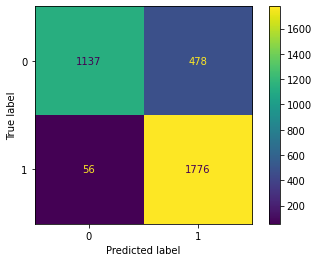

In [ ]:
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
plot_confusion_matrix(dt, test_set, test_label)
plt.show() 

The confusion matrix highlights how almost the totality of prediction errors was done on the non-bot users (which were predicted as bot).

In [ ]:
users_full = pd.read_csv(basepath + '/users_full_1.9.9.csv', lineterminator='\n', index_col=0, parse_dates=['sign_up_date', "last_activity"])

In [ ]:
df = users_full

In [ ]:
variables = ["lang"]
df = discretize_data(df, variables)

In [ ]:
df.drop(columns=variables, inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11487 entries, 2353593986 to 933183398
Data columns (total 46 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   bot                     11487 non-null  int64         
 1   sign_up_date            11487 non-null  datetime64[ns]
 2   statuses_count          11487 non-null  float64       
 3   st_per_day              11487 non-null  float64       
 4   tot_tweets              11487 non-null  int64         
 5   tot_favorites           11487 non-null  float64       
 6   tot_retweets            11487 non-null  float64       
 7   fav_std                 11487 non-null  float64       
 8   rtw_std                 11487 non-null  float64       
 9   fav_max                 11487 non-null  float64       
 10  rtw_max                 11487 non-null  float64       
 11  fav_mean                11487 non-null  float64       
 12  rtw_mean                11487 non

In [ ]:
df.sign_up_date = df.sign_up_date.astype(np.int64)

In [ ]:
df.last_activity = pd.to_datetime(df.last_activity).astype(np.int64)

In [ ]:
from sklearn.model_selection import train_test_split
label = df.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(df, label, stratify=label, test_size=0.30)

In [ ]:
from sklearn import tree
dt = tree.DecisionTreeClassifier(criterion='gini', splitter='best', 
                                  max_depth=5, 
                                  min_samples_split=3, min_samples_leaf=4)
dt = dt.fit(train_set, train_label)

In [ ]:
train_pred_dt = dt.predict(train_set)
test_pred_dt = dt.predict(test_set)

In [ ]:
from sklearn import metrics
print('Accuracy train set: ', metrics.accuracy_score(train_label, train_pred_dt))
print('Accuracy test set: ', metrics.accuracy_score(test_label, test_pred_dt))
#precision_score = tp / (tp + fp)
print('Precision train set: ', metrics.precision_score(train_label, train_pred_dt, average='weighted'))
#recall_score = tp / (tp + fn)
print('Recall train set: ', metrics.recall_score(train_label, train_pred_dt, average='weighted'))
#F1 = 2 * (precision * recall) / (precision + recall)
print('F1 score train set: ', metrics.f1_score(train_label, train_pred_dt, average='weighted'))
#metrics.precision_recall_fscore_support compute precisions, recalls, f-measures and support for each class
print('Support train set: ', metrics.precision_recall_fscore_support(train_label, train_pred_dt))

Accuracy train set:  0.858955223880597
Accuracy test set:  0.8656803017116333
Precision train set:  0.8885308111807826
Recall train set:  0.858955223880597
F1 score train set:  0.8547155358689078
Support train set:  (array([1.        , 0.79031065]), array([0.69888476, 1.        ]), array([0.82275711, 0.88287544]), array([3766, 4274]))


In [ ]:
users_full = pd.read_csv(basepath + '/users_full_1.9.9.csv', lineterminator='\n', index_col=0, parse_dates=['sign_up_date', "last_activity"])

In [ ]:
df = users_full

In [ ]:
clust_df = pd.read_csv(basepath + '/pp_users_full.csv')

In [ ]:
variables = ["lang"]
df = discretize_data(df, variables)

In [ ]:
df.drop(columns=variables, inplace=True)

In [ ]:
df = pd.merge(df[["lang_num", "bot", "sign_up_date", "last_activity"]], clust_df, left_index=True, right_on='user_id')

In [ ]:
df.sign_up_date = df.sign_up_date.astype(np.int64)

In [ ]:
df.last_activity = pd.to_datetime(df.last_activity).astype(np.int64)

In [ ]:
from sklearn.model_selection import train_test_split
label = df.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(df, label, stratify=label, test_size=0.30)

In [ ]:
from sklearn import tree
dt = tree.DecisionTreeClassifier(criterion='gini', splitter='best', 
                                  max_depth=3, 
                                  min_samples_split=3, min_samples_leaf=4)
dt = dt.fit(train_set, train_label)

In [ ]:
train_pred_dt = dt.predict(train_set)
test_pred_dt = dt.predict(test_set)

In [ ]:
from sklearn import metrics
print('Accuracy train set: ', metrics.accuracy_score(train_label, train_pred_dt))
print('Accuracy test set: ', metrics.accuracy_score(test_label, test_pred_dt))
#precision_score = tp / (tp + fp)
print('Precision train set: ', metrics.precision_score(train_label, train_pred_dt, average='weighted'))
#recall_score = tp / (tp + fn)
print('Recall train set: ', metrics.recall_score(train_label, train_pred_dt, average='weighted'))
#F1 = 2 * (precision * recall) / (precision + recall)
print('F1 score train set: ', metrics.f1_score(train_label, train_pred_dt, average='weighted'))
#metrics.precision_recall_fscore_support compute precisions, recalls, f-measures and support for each class
print('Support train set: ', metrics.precision_recall_fscore_support(train_label, train_pred_dt))

Accuracy train set:  0.8600746268656716
Accuracy test set:  0.8627792283144764
Precision train set:  0.8892311456239823
Recall train set:  0.8600746268656716
F1 score train set:  0.8559268129039961
Support train set:  (array([1.        , 0.79162808]), array([0.70127456, 1.        ]), array([0.8244108 , 0.88369689]), array([3766, 4274]))


it seems having lower max_depth maximes (by little) the accuracy value.

Even though the accuracy is higher, it is not that greater to actually prefer it adding so many features with regard to the clustering features.

#### 3.1.1.1 Testing other parameters

We can now test other parameters for the decision tree. Let's start with the 'entropy' criterion:

In [ ]:
dt = tree.DecisionTreeClassifier(criterion='entropy', splitter='best', 
                                  max_depth=10, 
                                  min_samples_split=3, min_samples_leaf=4)
dt = dt.fit(train_set, train_label)

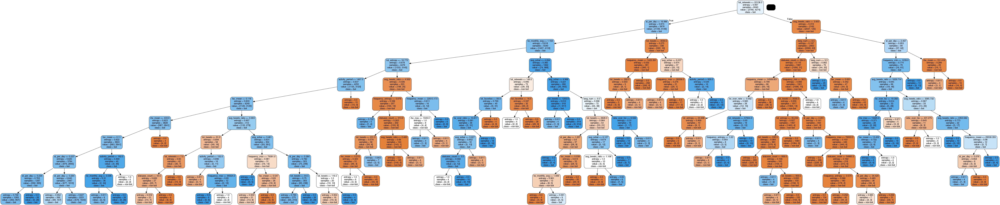

In [ ]:
import pydotplus 
from IPython.display import Image  
dot_data = tree.export_graphviz(dt, out_file=None, 
                         feature_names=list(train_set.columns),  
                         class_names=['non-bot', 'bot'],  
                         filled=True, rounded=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

In [ ]:
train_pred_dt = dt.predict(train_set)
test_pred_dt = dt.predict(test_set)

In [ ]:
print('Accuracy train set: ', metrics.accuracy_score(train_label, train_pred_dt))
print('Accuracy test set: ', metrics.accuracy_score(test_label, test_pred_dt))
#precision_score = tp / (tp + fp)
print('Precision train set: ', metrics.precision_score(train_label, train_pred_dt, average='weighted'))
#recall_score = tp / (tp + fn)
print('Recall train set: ', metrics.recall_score(train_label, train_pred_dt, average='weighted'))
#F1 = 2 * (precision * recall) / (precision + recall)
print('F1 score train set: ', metrics.f1_score(train_label, train_pred_dt, average='weighted'))
#metrics.precision_recall_fscore_support compute precisions, recalls, f-measures and support for each class
print('Support train set: ', metrics.precision_recall_fscore_support(train_label, train_pred_dt))

Accuracy train set:  0.8606965174129353
Accuracy test set:  0.8424717145343777
Precision train set:  0.8830986254983147
Recall train set:  0.8606965174129353
F1 score train set:  0.8573167245082765
Support train set:  (array([0.97865412, 0.79890068]), array([0.71826872, 0.9861956 ]), array([0.82848392, 0.88272251]), array([3766, 4274]))


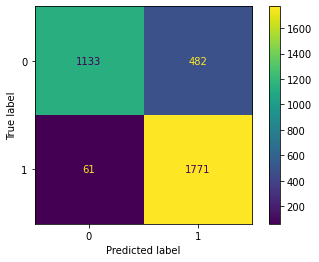

In [ ]:
plot_confusion_matrix(dt, test_set, test_label)
plt.show() 

We can see that the two decision trees are almost equal, let's try increase the depth limit:

In [ ]:
dt = tree.DecisionTreeClassifier(criterion='gini', splitter='best', 
                                  max_depth=20, 
                                  min_samples_split=3, min_samples_leaf=4)
dt = dt.fit(train_set, train_label)

In [ ]:
dot_data = tree.export_graphviz(dt, out_file=None, 
                         feature_names=list(train_set.columns),  
                         class_names=['non-bot', 'bot'],  
                         filled=True, rounded=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

We can see that the depth was strongly limited by the treshold we enforced, let's see if something really changed:

In [ ]:
train_pred_dt = dt.predict(train_set)
test_pred_dt = dt.predict(test_set)

In [ ]:
print('Accuracy train set: ', metrics.accuracy_score(train_label, train_pred_dt))
print('Accuracy test set: ', metrics.accuracy_score(test_label, test_pred_dt))
#precision_score = tp / (tp + fp)
print('Precision train set: ', metrics.precision_score(train_label, train_pred_dt, average='weighted'))
#recall_score = tp / (tp + fn)
print('Recall train set: ', metrics.recall_score(train_label, train_pred_dt, average='weighted'))
#F1 = 2 * (precision * recall) / (precision + recall)
print('F1 score train set: ', metrics.f1_score(train_label, train_pred_dt, average='weighted'))
#metrics.precision_recall_fscore_support compute precisions, recalls, f-measures and support for each class
print('Support train set: ', metrics.precision_recall_fscore_support(train_label, train_pred_dt))

Accuracy train set:  0.8920398009950249
Accuracy test set:  0.8149115172613867
Precision train set:  0.8968435092398314
Recall train set:  0.8920398009950249
F1 score train set:  0.8912506337902211
Support train set:  (array([0.94015796, 0.85867734]), array([0.82182687, 0.95390735]), array([0.87701899, 0.90379073]), array([3766, 4274]))


In [ ]:
report_scores(test_label, test_pred_dt)

              precision    recall  f1-score   support

     non-bot       0.85      0.74      0.79      1615
         bot       0.79      0.88      0.84      1832

    accuracy                           0.81      3447
   macro avg       0.82      0.81      0.81      3447
weighted avg       0.82      0.81      0.81      3447



In [ ]:
scores = cross_validate(dt, train_set, train_label, cv=3, return_train_score= True)
print('Fit time ', statistics.mean(scores['fit_time']))
print('Score time ', statistics.mean(scores['score_time']))
print('Test score ', statistics.mean(scores['test_score']))
print('Train score ', statistics.mean(scores['train_score']))

Fit time  0.13367191950480142
Score time  0.003012498219807943
Test score  0.8031094527363184
Train score  0.8908582089552239


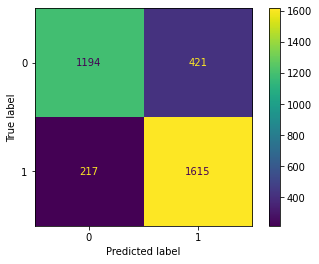

In [ ]:
plot_confusion_matrix(dt, test_set, test_label)
plt.show() 

We see that the performances of the decision three got worse going from max depth 10 to 20. It seems we kinda went into overfitting. 
It could be that the accuracy have its best values between depth 10 and 20 or for depth less than 10. Let's investigate this hypothesis:

In [ ]:
dt = tree.DecisionTreeClassifier(criterion='gini', splitter='best', 
                                  max_depth=15, 
                                  min_samples_split=3, min_samples_leaf=4)
dt = dt.fit(train_set, train_label)

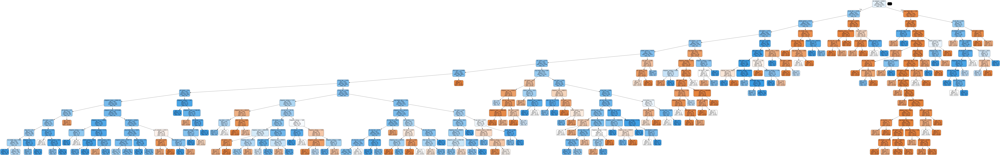

In [ ]:
dot_data = tree.export_graphviz(dt, out_file=None, 
                         feature_names=list(train_set.columns),  
                         class_names=['non-bot', 'bot'],  
                         filled=True, rounded=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

In [ ]:
train_pred_dt = dt.predict(train_set)
test_pred_dt = dt.predict(test_set)

In [ ]:
print('Accuracy train set: ', metrics.accuracy_score(train_label, train_pred_dt))
print('Accuracy test set: ', metrics.accuracy_score(test_label, test_pred_dt))
#precision_score = tp / (tp + fp)
print('Precision train set: ', metrics.precision_score(train_label, train_pred_dt, average='weighted'))
#recall_score = tp / (tp + fn)
print('Recall train set: ', metrics.recall_score(train_label, train_pred_dt, average='weighted'))
#F1 = 2 * (precision * recall) / (precision + recall)
print('F1 score train set: ', metrics.f1_score(train_label, train_pred_dt, average='weighted'))
#metrics.precision_recall_fscore_support compute precisions, recalls, f-measures and support for each class
print('Support train set: ', metrics.precision_recall_fscore_support(train_label, train_pred_dt))

Accuracy train set:  0.8732587064676617
Accuracy test set:  0.8265158108500145
Precision train set:  0.8844206369893348
Recall train set:  0.8732587064676617
F1 score train set:  0.8714877249190784
Support train set:  (array([0.95077125, 0.82595634]), array([0.76925119, 0.96490407]), array([0.850433  , 0.89003993]), array([3766, 4274]))


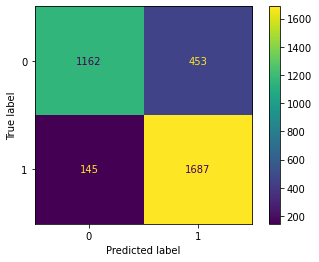

In [ ]:
plot_confusion_matrix(dt, test_set, test_label)
plt.show() 

It seems better than 20 but worst than 10, let's see if 10 is (more or less) an optimal value of if at 10 the loss of performance has already begun:

In [ ]:
dt = tree.DecisionTreeClassifier(criterion='gini', splitter='best', 
                                  max_depth=5, 
                                  min_samples_split=3, min_samples_leaf=4)
dt = dt.fit(train_set, train_label)

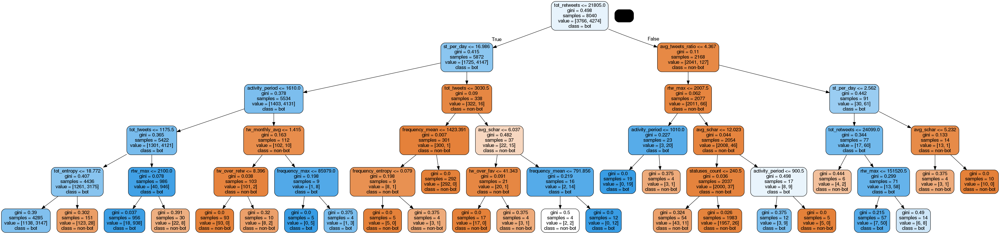

In [ ]:
dot_data = tree.export_graphviz(dt, out_file=None, 
                         feature_names=list(train_set.columns),  
                         class_names=['non-bot', 'bot'],  
                         filled=True, rounded=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

In [ ]:
train_pred_dt = dt.predict(train_set)
test_pred_dt = dt.predict(test_set)

In [ ]:
print('Accuracy train set: ', metrics.accuracy_score(train_label, train_pred_dt))
print('Accuracy test set: ', metrics.accuracy_score(test_label, test_pred_dt))
#precision_score = tp / (tp + fp)
print('Precision train set: ', metrics.precision_score(train_label, train_pred_dt, average='weighted'))
#recall_score = tp / (tp + fn)
print('Recall train set: ', metrics.recall_score(train_label, train_pred_dt, average='weighted'))
#F1 = 2 * (precision * recall) / (precision + recall)
print('F1 score train set: ', metrics.f1_score(train_label, train_pred_dt, average='weighted'))
#metrics.precision_recall_fscore_support compute precisions, recalls, f-measures and support for each class
print('Support train set: ', metrics.precision_recall_fscore_support(train_label, train_pred_dt))

Accuracy train set:  0.8437810945273632
Accuracy test set:  0.8378299970989266
Precision train set:  0.8692230566252616
Recall train set:  0.8437810945273632
F1 score train set:  0.8393985208986323
Support train set:  (array([0.96898356, 0.78131991]), array([0.68852894, 0.98058025]), array([0.80502949, 0.86968251]), array([3766, 4274]))


In [ ]:
report_scores(test_label, test_pred_dt)

              precision    recall  f1-score   support

     non-bot       0.96      0.68      0.80      1615
         bot       0.78      0.97      0.86      1832

    accuracy                           0.84      3447
   macro avg       0.87      0.83      0.83      3447
weighted avg       0.86      0.84      0.83      3447



In [ ]:
scores = cross_validate(dt, train_set, train_label, cv=3, return_train_score= True)
print('Fit time ', statistics.mean(scores['fit_time']))
print('Score time ', statistics.mean(scores['score_time']))
print('Test score ', statistics.mean(scores['test_score']))
print('Train score ', statistics.mean(scores['train_score']))

Fit time  0.053392489751180015
Score time  0.0028972625732421875
Test score  0.8390547263681591
Train score  0.8452736318407961


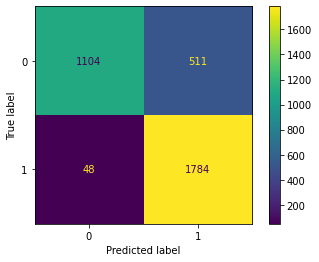

In [ ]:
plot_confusion_matrix(dt, test_set, test_label)
plt.show() 

We can see that with depth 10 and 5 the performances are higly comparable, so in terms of computational resources it is clearly better to choose max_depth=5 (and also with lower depth we stay away from overfitting)

#### 3.1.1.2 Reducing dimensionality

We now try to consistently reduce the number of featuresof the dataset

In [ ]:
clust_df = pd.read_csv(basepath + '/pp_users_full.csv')

In [ ]:
users_full = pd.read_csv(basepath + '/users_full_1.9.9.csv', lineterminator='\n', index_col=0, parse_dates=['sign_up_date'])

In [ ]:
df = pd.merge(users_full[["lang", "bot"]], clust_df, left_index=True, right_on='user_id')

In [ ]:
variables = ["lang"]
df = discretize_data(df, variables)

In [ ]:
df.drop(columns=variables, inplace=True)

In [ ]:
df.drop(columns="user_id", inplace=True)

In [ ]:
df_short = df[['bot', 'lang_num', 'statuses_count', 'retw_over_fav', 'tw_over_retw', 'tw_over_fav',
                    'activity_period', 'avg_tweets_ratio', 'tot_entropy']]

This reduction is based on an analysis did before in the clustering phase. The selected features are the most relevant ones. In addition, we have the lang_num column

In [ ]:
label = df_short.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(df_short, label, stratify=label, test_size=0.30)

In [ ]:
from sklearn import tree
dt = tree.DecisionTreeClassifier(criterion='gini', splitter='best', 
                                  max_depth=10, 
                                  min_samples_split=3, min_samples_leaf=4)
dt = dt.fit(train_set, train_label)

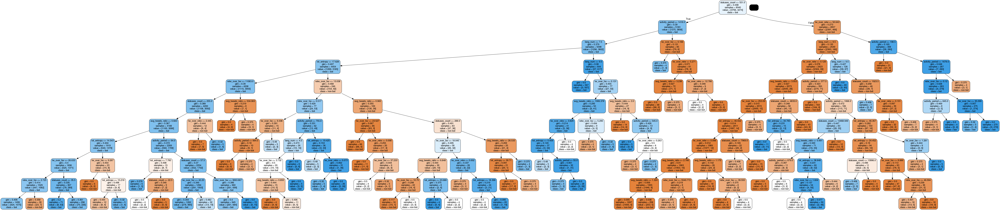

In [ ]:
import pydotplus 
from IPython.display import Image  
dot_data = tree.export_graphviz(dt, out_file=None, 
                         feature_names=list(train_set.columns),  
                         class_names=['non-bot', 'bot'],  
                         filled=True, rounded=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

In [ ]:
train_pred_dt = dt.predict(train_set)
test_pred_dt = dt.predict(test_set)

In [ ]:
from sklearn import metrics
print('Accuracy train set: ', metrics.accuracy_score(train_label, train_pred_dt))
print('Accuracy test set: ', metrics.accuracy_score(test_label, test_pred_dt))
#precision_score = tp / (tp + fp)
print('Precision train set: ', metrics.precision_score(train_label, train_pred_dt, average='weighted'))
#recall_score = tp / (tp + fn)
print('Recall train set: ', metrics.recall_score(train_label, train_pred_dt, average='weighted'))
#F1 = 2 * (precision * recall) / (precision + recall)
print('F1 score train set: ', metrics.f1_score(train_label, train_pred_dt, average='weighted'))
#metrics.precision_recall_fscore_support compute precisions, recalls, f-measures and support for each class
print('Support train set: ', metrics.precision_recall_fscore_support(train_label, train_pred_dt))

Accuracy train set:  0.8568407960199005
Accuracy test set:  0.8357992457209168
Precision train set:  0.8789605328656599
Recall train set:  0.8568407960199005
F1 score train set:  0.8533615177988012
Support train set:  (array([0.97321752, 0.79590677]), array([0.71402018, 0.98268601]), array([0.8237096 , 0.87948906]), array([3766, 4274]))


In [ ]:
report_scores(test_label, test_pred_dt)

              precision    recall  f1-score   support

     non-bot       0.95      0.68      0.80      1615
         bot       0.78      0.97      0.86      1832

    accuracy                           0.84      3447
   macro avg       0.86      0.83      0.83      3447
weighted avg       0.86      0.84      0.83      3447



In [ ]:
scores = cross_validate(dt, train_set, train_label, cv=3, return_train_score= True)
print('Fit time ', statistics.mean(scores['fit_time']))
print('Score time ', statistics.mean(scores['score_time']))
print('Test score ', statistics.mean(scores['test_score']))
print('Train score ', statistics.mean(scores['train_score']))

Fit time  0.03226788838704427
Score time  0.0026227633158365884
Test score  0.832089552238806
Train score  0.8593283582089553


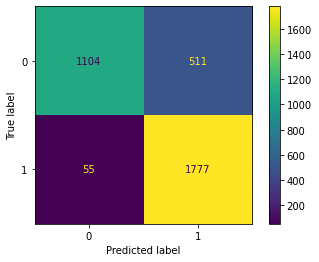

In [ ]:
plot_confusion_matrix(dt, test_set, test_label)
plt.show() 

We can see that the difference with the larger dataset are negligible. So, the feature selection we made seems to be good. Clearly, it is better to work with a smaller number of  features. But maybe, other classifiers benefit with the columns we just omitted. We will see.

Let's see if we can improve the already good classification performances of the Decision Tree classifier with Random Forest:

### 3.1.2 Random Forest

In [ ]:
clust_df = pd.read_csv(basepath + '/pp_users_full.csv')

In [ ]:
users_full = pd.read_csv(basepath + '/users_full_1.9.9.csv', lineterminator='\n', index_col=0, parse_dates=['sign_up_date'])

In [ ]:
df = pd.merge(users_full[["lang", "bot"]], clust_df, left_index=True, right_on='user_id')

In [ ]:
variables = ["lang"]
df = discretize_data(df, variables)

In [ ]:
df.drop(columns=variables, inplace=True)

In [ ]:
df.drop(columns="user_id", inplace=True)

In [ ]:
from sklearn.model_selection import train_test_split
label = df.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(df, label, stratify=label, test_size=0.30)

In [ ]:
#define and fit a random forest
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=30, 
                             criterion='gini',
                             max_features=3,
                             max_depth=4, 
                             min_samples_split=2,
                             min_samples_leaf=8,
                             bootstrap=True) 
rf = rf.fit(train_set, train_label)

In [ ]:
#prediction on the test test
test_pred_rf = rf.predict(test_set)

In [ ]:
from sklearn.metrics import classification_report
def report_scores(test_label, test_pred):
    print(classification_report(test_label, 
                            test_pred, 
                            target_names=['non-bot', 'bot']))

In [ ]:
#compute the performance of the model
report_scores(test_label, test_pred_rf)

              precision    recall  f1-score   support

     non-bot       0.95      0.67      0.79      1615
         bot       0.77      0.97      0.86      1832

    accuracy                           0.83      3447
   macro avg       0.86      0.82      0.82      3447
weighted avg       0.85      0.83      0.82      3447



It seems that there isn't any improvement with respect to decision trees.

We try to improve random forest by assigning different weights to the two classes: since the non-bot users are classified with a very high precision while bot users are often misclassified, we try to give a bigger weight to bot class:

In [ ]:
class_weights = {0: 0.35, 1:0.65}
rf = RandomForestClassifier(n_estimators=30, 
                             criterion='gini',
                             max_features=8,
                             max_depth=6, 
                             min_samples_split=32,
                             min_samples_leaf=10,
                             bootstrap=False,
                             class_weight= class_weights) 
rf = rf.fit(train_set, train_label)

In [ ]:
test_pred_rf = rf.predict(test_set)

In [ ]:
#compute the performance of the model
print(classification_report(test_label, 
                            test_pred_rf, 
                            target_names=['non-bot', 'bot']))

              precision    recall  f1-score   support

     non-bot       0.97      0.67      0.79      1615
         bot       0.77      0.98      0.86      1832

    accuracy                           0.84      3447
   macro avg       0.87      0.83      0.83      3447
weighted avg       0.86      0.84      0.83      3447



We can see a very little improvement, still not better than decision trees.

We try the opposite weight assignment because bot class has an high recall while non-bot has lower recall:

In [ ]:
class_weights = {0: 0.65, 1:0.35}
rf = RandomForestClassifier(n_estimators=30, 
                             criterion='gini',
                             max_features=8,
                             max_depth=6, 
                             min_samples_split=32,
                             min_samples_leaf=10,
                             bootstrap=False,
                             class_weight= class_weights) 
rf = rf.fit(train_set, train_label)

In [ ]:
test_pred_rf = rf.predict(test_set)

In [ ]:
#compute the performance of the model
print(classification_report(test_label, 
                            test_pred_rf, 
                            target_names=['non-bot', 'bot']))

              precision    recall  f1-score   support

     non-bot       0.92      0.69      0.79      1615
         bot       0.78      0.95      0.86      1832

    accuracy                           0.83      3447
   macro avg       0.85      0.82      0.82      3447
weighted avg       0.85      0.83      0.83      3447



We try a more imbalanced weight assignment:

In [ ]:
class_weights = {0: 0.1, 1:0.9}
rf = RandomForestClassifier(n_estimators=30, 
                             criterion='gini',
                             max_features=8,
                             max_depth=6, 
                             min_samples_split=32,
                             min_samples_leaf=10,
                             bootstrap=False,
                             class_weight= class_weights) 
rf = rf.fit(train_set, train_label)

In [ ]:
test_pred_rf = rf.predict(test_set)

In [ ]:
#compute the performance of the model
print(classification_report(test_label, 
                            test_pred_rf, 
                            target_names=['non-bot', 'bot']))

              precision    recall  f1-score   support

     non-bot       0.99      0.62      0.77      1615
         bot       0.75      0.99      0.85      1832

    accuracy                           0.82      3447
   macro avg       0.87      0.81      0.81      3447
weighted avg       0.86      0.82      0.81      3447



Again, no advantages.

We try to turn on the bootstrap:

In [ ]:
class_weights = {0: 0.35, 1:0.65}
rf = RandomForestClassifier(n_estimators=30, 
                             criterion='gini',
                             max_features=8,
                             max_depth=6, 
                             min_samples_split=32,
                             min_samples_leaf=10,
                             bootstrap=True,
                             class_weight= class_weights) 
rf = rf.fit(train_set, train_label)

In [ ]:
test_pred_rf = rf.predict(test_set)

In [ ]:
#compute the performance of the model
print(classification_report(test_label, 
                            test_pred_rf, 
                            target_names=['non-bot', 'bot']))

              precision    recall  f1-score   support

     non-bot       0.97      0.66      0.79      1615
         bot       0.77      0.98      0.86      1832

    accuracy                           0.83      3447
   macro avg       0.87      0.82      0.82      3447
weighted avg       0.86      0.83      0.83      3447



It get slightly worse.

As a last try we change more parameters even if at this point it is clear that Random Forest is bringing no advantages:

In [ ]:
class_weights = {0: 0.35, 1:0.65}
rf = RandomForestClassifier(n_estimators=15, 
                             criterion='entropy',
                             max_features=10,
                             max_depth=10, 
                             min_samples_split=32,
                             min_samples_leaf=5,
                             bootstrap=False,
                             class_weight= class_weights) 
rf = rf.fit(train_set, train_label)

In [ ]:
test_pred_rf = rf.predict(test_set)

In [ ]:
#compute the performance of the model
print(classification_report(test_label, 
                            test_pred_rf, 
                            target_names=['non-bot', 'bot']))

              precision    recall  f1-score   support

     non-bot       0.97      0.67      0.80      1615
         bot       0.77      0.98      0.87      1832

    accuracy                           0.84      3447
   macro avg       0.87      0.83      0.83      3447
weighted avg       0.87      0.84      0.83      3447



As expected. We now pass to other kind of classifiers. 

Let's see the probabilistic classifier Naive Bayes

### 3.1.3 Naive Bayes classification

We now try to classify via Bayes classifier with the naive assumption of independence:

In [ ]:
clust_df = pd.read_csv(basepath + '/pp_users_full.csv')

In [ ]:
users_full = pd.read_csv(basepath + '/users_full_1.9.9.csv', lineterminator='\n', index_col=0, parse_dates=['sign_up_date'])

In [ ]:
df = pd.merge(users_full[["lang", "bot"]], clust_df, left_index=True, right_on='user_id')

In [ ]:
variables = ["lang"]
df = discretize_data(df, variables)

In [ ]:
df.drop(columns=variables, inplace=True)

In [ ]:
df.drop(columns="user_id", inplace=True)

In [ ]:
from sklearn.model_selection import train_test_split
label = df.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(df, label, stratify=label, test_size=0.30)

In [ ]:
#import, define and fit the model
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(train_set, train_label)

#predict on the test set
test_pred_gnb = gnb.predict(test_set)

In [ ]:
#compute the performance of the model
report_scores(test_label,test_pred_gnb)

              precision    recall  f1-score   support

     non-bot       0.98      0.41      0.58      1615
         bot       0.66      0.99      0.79      1832

    accuracy                           0.72      3447
   macro avg       0.82      0.70      0.68      3447
weighted avg       0.81      0.72      0.69      3447



Beyes classifier need to assume the distribution of the likelihood of the features. With Gaussian Naive Bayes the results are not really good.

We try with the Complement Naive Bayes, which is an adaptation of the standard multinomial naive Bayes algorithm that is particularly suited for imbalanced data sets, so it could be good in our case. However, multinomailNB assumes positive data, while we have some negative data in the ratios

In [ ]:
(df < 0).any()

statuses_count       False
st_per_day           False
tot_tweets           False
tot_favorites        False
tot_retweets         False
rtw_max              False
fav_mean             False
rtw_mean             False
retw_over_fav         True
tw_over_retw          True
tw_over_fav           True
avg_schar            False
activity_period      False
tw_monthly_avg       False
avg_tweets_ratio      True
frequency_min         True
frequency_mean        True
frequency_max         True
frequency_entropy     True
tot_entropy          False
lang_num             False
dtype: bool

We try to use MinMax scaler in order to make data positive:

In [ ]:
from sklearn.preprocessing import MinMaxScaler #fixed import

scaler = MinMaxScaler()
train_set = scaler.fit_transform(train_set)
test_set = scaler.transform(test_set)

In [ ]:
#import, define and fit the model
from sklearn.naive_bayes import ComplementNB

gnb = ComplementNB()
gnb.fit(train_set, train_label)

#predict on the test set
test_pred_gnb = gnb.predict(test_set)

In [ ]:
#compute the performance of the model
report_scores(test_label,test_pred_gnb)

              precision    recall  f1-score   support

     non-bot       0.69      0.58      0.63      1615
         bot       0.67      0.77      0.72      1832

    accuracy                           0.68      3447
   macro avg       0.68      0.68      0.67      3447
weighted avg       0.68      0.68      0.68      3447



We see that the ComplementNB has poor performances.

Maybe, assuming independence in our data is a too strong assumption. Also, assuming a distribution of this kind (gaussian or multinomial) when we have very ugly distributions with extreme long tails is a big assumption. So, we can conclude that Naive Bayes does not work very well for our data

Since GaussianNB works with normal distributions, we can try to use the Standard Scaler before classifying:

In [ ]:
clust_df = pd.read_csv(basepath + '/pp_users_full.csv')

In [ ]:
users_full = pd.read_csv(basepath + '/users_full_1.9.9.csv', lineterminator='\n', index_col=0, parse_dates=['sign_up_date'])

In [ ]:
df = pd.merge(users_full[["lang", "bot"]], clust_df, left_index=True, right_on='user_id')

In [ ]:
variables = ["lang"]
df = discretize_data(df, variables)

In [ ]:
df.drop(columns=variables, inplace=True)

In [ ]:
df.drop(columns="user_id", inplace=True)

In [ ]:
label = df.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(df, label, stratify=label, test_size=0.30)

In [ ]:
from sklearn.preprocessing import StandardScaler #fixed import

scaler = StandardScaler()
train_set = scaler.fit_transform(train_set)
test_set = scaler.transform(test_set)

In [ ]:
#import, define and fit the model
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(train_set, train_label)

#predict on the test set
test_pred_gnb = gnb.predict(test_set)

In [ ]:
#compute the performance of the model
report_scores(test_label,test_pred_gnb)

              precision    recall  f1-score   support

     non-bot       0.96      0.52      0.68      1615
         bot       0.70      0.98      0.82      1832

    accuracy                           0.77      3447
   macro avg       0.83      0.75      0.75      3447
weighted avg       0.82      0.77      0.75      3447



We can see a noticeable improvement in the performance of the model. Even if the accuracy is quite good (77%), decision tree seems to outperform Naive Bayes classifier in our case

We try again to reduce dimensionality in order to assess if some features are misleading the classifier:

In [ ]:
clust_df = pd.read_csv(basepath + '/pp_users_full.csv')

In [ ]:
users_full = pd.read_csv(basepath + '/users_full_1.9.9.csv', lineterminator='\n', index_col=0, parse_dates=['sign_up_date'])

In [ ]:
df = pd.merge(users_full[["lang", "bot"]], clust_df, left_index=True, right_on='user_id')

In [ ]:
variables = ["lang"]
df = discretize_data(df, variables)

In [ ]:
df.drop(columns=variables, inplace=True)

In [ ]:
df.drop(columns="user_id", inplace=True)

In [ ]:
df_short = df[['bot', 'lang_num', 'statuses_count', 'retw_over_fav', 'tw_over_retw', 'tw_over_fav',
                    'activity_period', 'avg_tweets_ratio', 'tot_entropy']]

In [ ]:
label = df_short.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(df_short, label, stratify=label, test_size=0.30)

In [ ]:
from sklearn.preprocessing import StandardScaler #fixed import

scaler = StandardScaler()
train_set = scaler.fit_transform(train_set)
test_set = scaler.transform(test_set)

In [ ]:
#import, define and fit the model
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(train_set, train_label)

#predict on the test set
test_pred_gnb = gnb.predict(test_set)

In [ ]:
#compute the performance of the model
report_scores(test_label,test_pred_gnb)

              precision    recall  f1-score   support

     non-bot       0.92      0.51      0.65      1615
         bot       0.69      0.96      0.80      1832

    accuracy                           0.75      3447
   macro avg       0.80      0.73      0.73      3447
weighted avg       0.80      0.75      0.73      3447



It seems we lost important information. However, the difference with the full dataset is almost negligible

### 3.1.4 AdaBoost

For AdaBoost we have to choose the base classifier. Since the one who performed better was the Decision Tree, we use this

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn import tree
base = tree.DecisionTreeClassifier(max_depth=5)
clf = AdaBoostClassifier(base_estimator=base, n_estimators=200, learning_rate=0.1)
clf.fit(train_set, train_label)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=5),
                   learning_rate=0.1, n_estimators=200)

In [ ]:
test_pred_clf = clf.predict(test_set)
print(classification_report(test_label, 
                            test_pred_clf, 
                            target_names=['non-bot', 'bot']))

              precision    recall  f1-score   support

     non-bot       0.83      0.73      0.77      1615
         bot       0.78      0.87      0.82      1832

    accuracy                           0.80      3447
   macro avg       0.81      0.80      0.80      3447
weighted avg       0.80      0.80      0.80      3447



Not good performances, a learning rate too high could be a problem in some cases. We try to reduce it. We also reduce the number of estimators:

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn import tree
base = tree.DecisionTreeClassifier(max_depth=5)
clf = AdaBoostClassifier(base_estimator=base, n_estimators=100, learning_rate=0.005)
clf.fit(train_set, train_label)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=5),
                   learning_rate=0.005, n_estimators=100)

In [ ]:
test_pred_clf = clf.predict(test_set)
print(classification_report(test_label, 
                            test_pred_clf, 
                            target_names=['non-bot', 'bot']))

              precision    recall  f1-score   support

     non-bot       0.96      0.68      0.80      1615
         bot       0.78      0.98      0.86      1832

    accuracy                           0.84      3447
   macro avg       0.87      0.83      0.83      3447
weighted avg       0.86      0.84      0.83      3447



AdaBoost, like RandomForest, seems not capable of improving the performances achieved with the basic Decision Tree

## 3.2 Distance-based classification

### 3.2.1 K-NN

We start with K-NN. 

First, we set a reasonable number of neighbors, like 10, and then we explore other values:

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
neigh = KNeighborsClassifier(n_neighbors=10)
neigh.fit(train_set, train_label)

KNeighborsClassifier(n_neighbors=10)

In [ ]:
neigh.score(test_set, test_label)

0.8120104438642297

In [ ]:
neigh = KNeighborsClassifier(n_neighbors=15)
neigh.fit(train_set, train_label)

KNeighborsClassifier(n_neighbors=15)

In [ ]:
neigh.score(test_set, test_label)

0.8210037713954162

In [ ]:
neigh = KNeighborsClassifier(n_neighbors=20)
neigh.fit(train_set, train_label)

KNeighborsClassifier(n_neighbors=20)

In [ ]:
neigh.score(test_set, test_label)

0.821293878735132

In [ ]:
neigh = KNeighborsClassifier(n_neighbors=5)
neigh.fit(train_set, train_label)

KNeighborsClassifier()

In [ ]:
neigh.score(test_set, test_label)

0.8044676530316217

In [ ]:
neigh = KNeighborsClassifier(n_neighbors=30)
neigh.fit(train_set, train_label)

KNeighborsClassifier(n_neighbors=30)

In [ ]:
neigh.score(test_set, test_label)

0.8207136640557006

It seems that the best accuracy is reached with 20 neighbors.

Now, we try to go more in deep and change some parameters. First, we try to use a weighted (on distance) score for the neighbors:

In [ ]:
neigh = KNeighborsClassifier(n_neighbors=20, weights='distance')
neigh.fit(train_set, train_label)

KNeighborsClassifier(n_neighbors=20, weights='distance')

In [ ]:
neigh.score(test_set, test_label)

0.8239048447925732

We see a very little improvement. We try to change the distance (deault is minkowski)

In [ ]:
neigh = KNeighborsClassifier(n_neighbors=20, weights='distance', metric='euclidean')
neigh.fit(train_set, train_label)

KNeighborsClassifier(metric='euclidean', n_neighbors=20, weights='distance')

In [ ]:
neigh.score(test_set, test_label)

0.8239048447925732

Absolutely no difference.

We now try to reduce the dimensions of our dataset taking only few columns. There is the possibility that some dimensions are misleading the algorithm

In [ ]:
df = pd.merge(users_full[["bot"]], clust_df, left_index=True, right_on='user_id')

In [ ]:
df_short = df[['bot', 'statuses_count', 'retw_over_fav', 'tw_over_retw', 'tw_over_fav',
                    'activity_period', 'avg_tweets_ratio', 'tot_entropy']]

In [ ]:
label = df_short.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(df_short, label, stratify=label, test_size=0.30)

In [ ]:
neighbors = [5,10,20,30,50,100]
neigh = [KNeighborsClassifier(n_neighbors=i, weights='distance') for i in neighbors]
for x in neigh:
    x.fit(train_set, train_label)

In [ ]:
for x in neigh:
    print(x.score(test_set, test_label))

0.7879315346678271
0.7969248621990136
0.8134609805628082
0.8175224833188279
0.8160719466202495
0.8128807658833769


We still see no improvements.

The reached accuracy of 82,4% with 20 neighbors and weighted neighbors score is a good classification accuracy

### 3.2.2 Neural Net (Multi-Layer Perceptron)

#### 3.2.2.1 Neural Net

Importing and preparing the dataset

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
import re
from tqdm import tqdm
tqdm.pandas()

import warnings
warnings.filterwarnings(action='ignore')
from google.colab import drive
drive.mount('/content/drive')
basepath = "/content/drive/MyDrive/DataMining22Gruppo8/data/dataset"

In [ ]:
clust_df = pd.read_csv(basepath + '/pp_users_full.csv')
users_full = pd.read_csv(basepath + '/users_full_1.9.9.csv', lineterminator='\n', index_col=0, parse_dates=['sign_up_date'])
df = pd.merge(users_full[["bot"]], clust_df, left_index=True, right_on='user_id')
df.drop(columns="user_id", inplace=True)

In [ ]:
from sklearn.model_selection import train_test_split
label = df.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(df, label, stratify=label, test_size=0.30)

Importing sklearn MultiLayerPerceptronClassifier

Train: 0.5526119402985075
Test: 0.5471424427038004


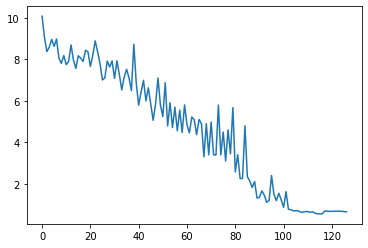

In [ ]:
from sklearn.neural_network import MLPClassifier
clf = MLPClassifier(hidden_layer_sizes=(50,50), activation="relu", solver='adam', batch_size=50, max_iter=800).fit(train_set, train_label)
clf.predict_proba(test_set)
clf.predict(test_set)
print("Train:", clf.score(train_set, train_label))
print("Test:", clf.score(test_set, test_label))
plt.plot(clf.loss_curve_)

Train: 0.5378109452736318
Test: 0.5381491151726139


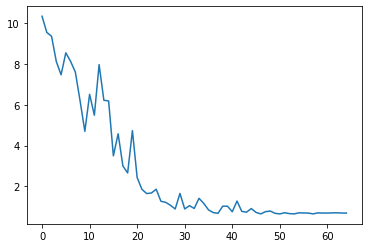

In [ ]:
from sklearn.neural_network import MLPClassifier
clf = MLPClassifier(hidden_layer_sizes=(50,100,100,50), activation="relu", solver='adam', batch_size=50, learning_rate='invscaling', max_iter=3000).fit(train_set, train_label)
clf.predict_proba(test_set)
clf.predict(test_set)
print("Train:", clf.score(train_set, train_label))
print("Test:", clf.score(test_set, test_label))
plt.plot(clf.loss_curve_)

Train: 0.8175373134328359
Test: 0.8093994778067886


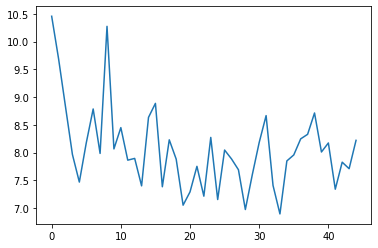

In [ ]:
from sklearn.neural_network import MLPClassifier
clf = MLPClassifier(hidden_layer_sizes=(50,50), activation="relu", solver='adam', batch_size=200, max_iter=1000).fit(train_set, train_label)
clf.predict_proba(test_set)
clf.predict(test_set)
print("Train:", clf.score(train_set, train_label))
print("Test:", clf.score(test_set, test_label))
plt.plot(clf.loss_curve_)

after testing a few different parameters we came up with these parameters to achieve the best test accuracy: 
```
hidden_layer_sizes=(50,50), activation="relu", solver='adam', batch_size=200, max_iter=1000)
```

#### 3.2.2.2 Genetic Algorithm Neural Net

to better explore the hyperparameters space we chose to setup a genetic search algorithm that finds the best model parameters in a predefined search space

In [ ]:
!pip install sklearn_genetic sklearn-genetic-opt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 139 kB 7.8 MB/s 
     |████████████████████████████████| 132 kB 61.4 MB/s 


In [ ]:
from sklearn.neural_network import MLPClassifier
clf = MLPClassifier()

from sklearn_genetic.space import Continuous, Categorical, Integer
from sklearn_genetic.plots import plot_fitness_evolution, plot_search_space

hyperspace = {
              'hidden_layer_sizes': Categorical([(25,25),(50,50),(50,50,20)]),
              'learning_rate_init': Continuous(0.001, 0.01, distribution='log-uniform'),
              'activation': Categorical(['relu', 'logistic']),
              'learning_rate': Categorical(['constant', 'invscaling', 'adaptive']),
              'solver': Categorical(['sgd', 'adam']),
              'batch_size': Integer(5, 300),
              'max_iter': Integer(800, 3000)
              }



#fine_tuning
#clf = MLPClassifier(hidden_layer_sizes=(50,50), activation="relu", solver='adam', batch_size=200, max_iter=1000).fit(train_set, train_label)

finespace = {
              'hidden_layer_sizes': Categorical([(50,50),(100,100),(60,50,20),(40,60,40)]),
              'learning_rate_init': Continuous(0.001, 0.01, distribution='log-uniform'),
              'activation': Categorical(['relu']),
              'learning_rate': Categorical(['invscaling', 'adaptive']),
              'solver': Categorical(['sgd', 'adam']),
              'batch_size': Integer(5, 300),
              'max_iter': Integer(800, 2000)
              }

In [ ]:
from sklearn.model_selection import StratifiedKFold
cv = StratifiedKFold(n_splits=3, shuffle=True)

In [ ]:
from sklearn_genetic import GASearchCV
evolved_estimator = GASearchCV(estimator=clf,
                               cv=cv,
                               scoring='accuracy',
                               population_size=16,
                               generations=8,
                               tournament_size=4,
                               elitism=True,
                               crossover_probability=0.6,
                               mutation_probability=0.4,
                               param_grid=finespace,
                               criteria='max',
                               algorithm='eaMuPlusLambda',
                               n_jobs=-1,
                               verbose=True,
                               keep_top_k=4)

In [ ]:
from sklearn.metrics import accuracy_score

evolved_estimator.fit(train_set, train_label)
y_predicy_ga = evolved_estimator.predict(test_set)

#accuracy_score(test_set, test_label)

gen	nevals	fitness	fitness_std	fitness_max	fitness_min
0  	16    	0.59197	0.12916    	0.825      	0.468408   
1  	32    	0.749526	0.070122   	0.817537   	0.552239   
2  	32    	0.803685	0.0246197  	0.822637   	0.727736   
3  	32    	0.812889	0.011463   	0.826244   	0.780721   
4  	32    	0.814513	0.0122801  	0.826244   	0.780721   
5  	32    	0.804866	0.02954    	0.826244   	0.730224   
6  	32    	0.800614	0.0248516  	0.822388   	0.72699    
7  	32    	0.803794	0.0235679  	0.822388   	0.729104   
8  	32    	0.808675	0.0139969  	0.822388   	0.781219   


In [ ]:
evolved_estimator.estimator

MLPClassifier(batch_size=110, hidden_layer_sizes=(50, 50),
              learning_rate='invscaling',
              learning_rate_init=0.003202844469670069, max_iter=1064)

**estimator.pkl**

MLPClassifier(batch_size=79, hidden_layer_sizes=(25, 25),
              learning_rate_init=0.001046313993647935, max_iter=256)

```
gen	nevals	fitness	fitness_std	fitness_max	fitness_min
0  	10    	0.71745	0.0830701  	0.80908    	0.489303   
1  	16    	0.765323	0.0311108  	0.80908    	0.6801     
2  	15    	0.77143 	0.00460201 	0.775622   	0.762811   
3  	16    	0.773582	0.00196517 	0.775622   	0.770398   
4  	17    	0.774975	0.000906852	0.775622   	0.772886   
5  	17    	0.775299	0.000667946	0.775622   	0.773383   
6  	16    	0.775485	0.00028607 	0.775622   	0.774751   
12 	18    	0.775609	0.00069574 	0.776617   	0.774005
```


**estimator2.pkl**

MLPClassifier(activation='logistic', batch_size=240,
              hidden_layer_sizes=(50, 50, 20),
              learning_rate_init=0.007684709504195306, max_iter=1195)
```
gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	5     	0.638284	0.116734   	0.773259   	0.489428   
1  	10    	0.721219	0.0948504  	0.773259   	0.531592   
2  	10    	0.723458	0.095939   	0.773259   	0.531592   
3  	10    	0.770945	0.0029888  	0.773632   	0.765299   
4  	10    	0.774577	0.000670258	0.775124   	0.773756   
5  	10    	0.774577	0.000670258	0.775124   	0.773756 
```

**estimator3.pkl**

MLPClassifier(batch_size=110, hidden_layer_sizes=(50, 50),
              learning_rate='invscaling',
              learning_rate_init=0.003202844469670069, max_iter=1064)

```
gen	nevals	fitness	fitness_std	fitness_max	fitness_min
0  	16    	0.59197	0.12916    	0.825      	0.468408   
1  	32    	0.749526	0.070122   	0.817537   	0.552239   
2  	32    	0.803685	0.0246197  	0.822637   	0.727736   
3  	32    	0.812889	0.011463   	0.826244   	0.780721   
4  	32    	0.814513	0.0122801  	0.826244   	0.780721   
5  	32    	0.804866	0.02954    	0.826244   	0.730224   
6  	32    	0.800614	0.0248516  	0.822388   	0.72699    
7  	32    	0.803794	0.0235679  	0.822388   	0.729104   
8  	32    	0.808675	0.0139969  	0.822388   	0.781219   
```

after searching different spaces we see that we have achieved comparable results with our choice of parameters. Therefore we can state that the neural network approach can achieve up to 0.8 accuracy score on average. The best result ever was obtained in generation 3 of estimator 3 finespace exploration, achieving an accuracy of 0.826

In [ ]:
# saving the trained model 

import pickle
with open("/content/drive/MyDrive/DataMining22Gruppo8/data/estimator3.pkl","wb") as f:
    pickle.dump(evolved_estimator.estimator,f)

### 3.2.3 Support Vector Machine

Now we try to classify using SVM classifier from scikit learn.

In [ ]:
clust_df = pd.read_csv(basepath + '/pp_users_full.csv')

In [ ]:
users_full = pd.read_csv(basepath + '/users_full_1.9.9.csv', lineterminator='\n', index_col=0, parse_dates=['sign_up_date'])

In [ ]:
df = pd.merge(users_full[["bot"]], clust_df, left_index=True, right_on='user_id')

In [ ]:
df.drop(columns="user_id", inplace=True)

In [ ]:
from sklearn.model_selection import train_test_split
label = df.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(df, label, stratify=label, test_size=0.30)

In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
clf.fit(train_set, train_label)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(gamma='auto'))])

In [ ]:
clf.predict(train_set)
print("Accuracy on training set: ", round(clf.score(train_set,train_label), 4))
clf.predict(test_set)
print("Accuracy on test set: ", round(clf.score(test_set,test_label), 4))

Accuracy on training set:  0.8402
Accuracy on test set:  0.8416


We suddenly notice a very good classification accuracy, even slightly better on the test set than on the training set.

Let's now try to change same parameters, for example the scaler because we observed that sometimes it could work better with our dataset:

In [ ]:
from sklearn.preprocessing import MinMaxScaler
clf = make_pipeline(MinMaxScaler(), SVC(gamma='auto'))
clf.fit(train_set, train_label)

Pipeline(steps=[('minmaxscaler', MinMaxScaler()), ('svc', SVC(gamma='auto'))])

In [ ]:
clf.predict(train_set)
print("Accuracy on training set: ", round(clf.score(train_set,train_label), 4))
clf.predict(test_set)
print("Accuracy on test set: ", round(clf.score(test_set,test_label), 4))

Accuracy on training set:  0.7604
Accuracy on test set:  0.7644


Apparently this is not the case, so let's go back to standard scaler and try to tune other parameters:

First we try to reduce the regularization (default is C=1) because, having such skewed data with a too strict regularization could not be optimal:

In [ ]:
clf = make_pipeline(StandardScaler(), SVC(C=2, gamma='auto'))
clf.fit(train_set, train_label)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(C=2, gamma='auto'))])

In [ ]:
clf.predict(train_set)
print("Accuracy on training set: ", round(clf.score(train_set,train_label), 4))
clf.predict(test_set)
print("Accuracy on test set: ", round(clf.score(test_set,test_label), 4))

Accuracy on training set:  0.8427
Accuracy on test set:  0.8422


It got better, let's try a stronger regularization to test our hypothesis:

In [ ]:
clf = make_pipeline(StandardScaler(), SVC(C=0.5, gamma='auto'))
clf.fit(train_set, train_label)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(C=0.5, gamma='auto'))])

In [ ]:
clf.predict(train_set)
print("Accuracy on training set: ", round(clf.score(train_set,train_label), 4))
clf.predict(test_set)
print("Accuracy on test set: ", round(clf.score(test_set,test_label), 4))

Accuracy on training set:  0.8213
Accuracy on test set:  0.8207


As supposed, it got worse

In [ ]:
clf = make_pipeline(StandardScaler(), SVC(C=2, gamma='auto'))
clf.fit(train_set, train_label)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(C=2, gamma='auto'))])

In [ ]:
clf.predict(train_set)
print("Accuracy on training set: ", round(clf.score(train_set,train_label), 4))
clf.predict(test_set)
print("Accuracy on test set: ", round(clf.score(test_set,test_label), 4))

Accuracy on training set:  0.8427
Accuracy on test set:  0.8422


In [ ]:
from sklearn.metrics import classification_report
def report_scores(test_label, test_pred):
    print(classification_report(test_label, 
                            test_pred, 
                            target_names=['non-bot', 'bot']))

In [ ]:
train_pred = clf.predict(train_set)
test_pred = clf.predict(test_set)

In [ ]:
report_scores(test_label, test_pred)

              precision    recall  f1-score   support

     non-bot       0.97      0.69      0.80      1615
         bot       0.78      0.98      0.87      1832

    accuracy                           0.84      3447
   macro avg       0.87      0.83      0.84      3447
weighted avg       0.87      0.84      0.84      3447



We see that the the prediction performances on the two classes are different. We can try to change classes weights:

In [ ]:
class_weights = {1: 0.4, 0: 0.6}

In [ ]:
clf = make_pipeline(StandardScaler(), SVC(class_weight=class_weights, C=2, gamma='auto'))
clf.fit(train_set, train_label)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(C=2, class_weight={0: 0.6, 1: 0.4}, gamma='auto'))])

In [ ]:
clf.predict(train_set)
print("Accuracy on training set: ", round(clf.score(train_set,train_label), 4))
clf.predict(test_set)
print("Accuracy on test set: ", round(clf.score(test_set,test_label), 4))

Accuracy on training set:  0.8414
Accuracy on test set:  0.8396


In [ ]:
class_weights = {0: 0.4, 1: 0.6}

In [ ]:
clf = make_pipeline(StandardScaler(), SVC(class_weight=class_weights, C=2, gamma='auto'))
clf.fit(train_set, train_label)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(C=2, class_weight={0: 0.4, 1: 0.6}, gamma='auto'))])

In [ ]:
clf.predict(train_set)
print("Accuracy on training set: ", round(clf.score(train_set,train_label), 4))
clf.predict(test_set)
print("Accuracy on test set: ", round(clf.score(test_set,test_label), 4))

Accuracy on training set:  0.8364
Accuracy on test set:  0.8378


We see that there is not an improvement

We try now to not use a scaler:

In [ ]:
clf = SVC(gamma='auto')
clf.fit(train_set, train_label)

SVC(gamma='auto')

In [ ]:
clf.predict(train_set)
print("Accuracy on training set: ", round(clf.score(train_set,train_label), 4))
clf.predict(test_set)
print("Accuracy on test set: ", round(clf.score(test_set,test_label), 4))

Accuracy on training set:  0.9994
Accuracy on test set:  0.5309


The classifier went in overfitting

In [ ]:
clust_df = pd.read_csv(basepath + '/pp_users_full.csv')

In [ ]:
users_full = pd.read_csv(basepath + '/users_full_1.9.9.csv', lineterminator='\n', index_col=0, parse_dates=['sign_up_date'])

In [ ]:
df = pd.merge(users_full[["bot"]], clust_df, left_index=True, right_on='user_id')

In [ ]:
df_short = df[['bot', 'statuses_count', 'retw_over_fav', 'tw_over_retw', 'tw_over_fav',
                    'activity_period', 'avg_tweets_ratio', 'tot_entropy']]

In [ ]:
label = df_short.pop('bot')
train_set, test_set, train_label, test_label = train_test_split(df_short, label, stratify=label, test_size=0.30)

In [ ]:
clf = make_pipeline(StandardScaler(), SVC(C=2, gamma='auto'))
clf.fit(train_set, train_label)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(C=2, gamma='auto'))])

In [ ]:
clf.predict(train_set)
print("Accuracy on training set: ", round(clf.score(train_set,train_label), 4))
clf.predict(test_set)
print("Accuracy on test set: ", round(clf.score(test_set,test_label), 4))

Accuracy on training set:  0.8093
Accuracy on test set:  0.821


No improvements reducing dimensionality. It is however a good result.

We can conclude that SVM is among the best classifier we explored for our data

## 3.3 Results

```
DecisionTree      0.85
RandomForest      0.84
NaiveBayes        0.77
AdaBoost          0.84
MLPC              0.83
SVM               0.84
```